In [1]:
from tqec.computation.prism import BasisPrism, Position3DHex, ZXPrism
from tqec.computation.pipe_prism import PrismPipeKind
from tqec.computation.prism_graph import PrismGraph
from tqec.computation.correlation import find_correlation_surfaces

import mqt.qecc

import temp_utils

import numpy as np

# Single Blue Rank-5 Junction

In [2]:
g = PrismGraph("red junction")

prisms = [
    (Position3DHex(0,0,1), "NN", "middle"),
    (Position3DHex(0,0,2), "Port", "top"),
    (Position3DHex(0,0,0), "Port", "bottom"),
    (Position3DHex(1,1,1), "Port", "left"),
    (Position3DHex(-1,1,1), "Port", "right"),
    (Position3DHex(1,-1,1), "Port", "down"),
]

for pos, kind, label in prisms:
    g.add_prism(pos, kind, label)

In [3]:
#middle bottom
pipe_kind = PrismPipeKind(hor = BasisPrism.N, ver = BasisPrism.N)
g.add_pipe(prisms[0][0], prisms[2][0], pipe_kind)

#middle top
pipe_kind = PrismPipeKind(hor = BasisPrism.N, ver = BasisPrism.N)
g.add_pipe(prisms[0][0], prisms[1][0], pipe_kind)

#middle left
pipe_kind = PrismPipeKind(hor = BasisPrism.X, ver = BasisPrism.Z)
g.add_pipe(prisms[0][0], prisms[3][0], pipe_kind)

#middle right
pipe_kind = PrismPipeKind(hor = BasisPrism.X, ver = BasisPrism.Z)
g.add_pipe(prisms[0][0], prisms[4][0], pipe_kind)

#middle down
pipe_kind = PrismPipeKind(hor = BasisPrism.X, ver = BasisPrism.Z)
g.add_pipe(prisms[0][0], prisms[5][0], pipe_kind)

In [4]:
g.view_as_html()

screenshot as html is not properly displayed in browser version of github
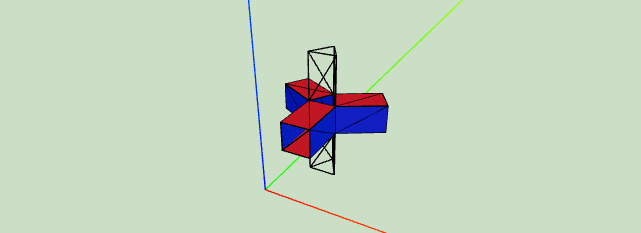

(<Figure size 500x600 with 1 Axes>, <Axes3D: >)

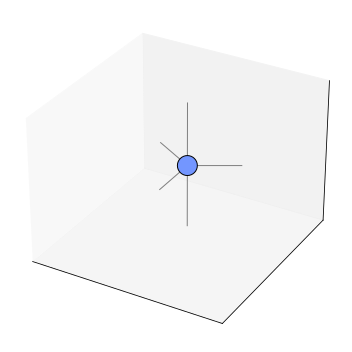

In [5]:
zx = g.to_zx_graph()
zx.draw()

In [6]:
#todo sanity check the correlation surface
corr_surf = find_correlation_surfaces(zx._g)

#for el in corr_surf:
#    print(el)

## Stabilizers Time Slice 0 (single patch)

In [7]:
z=0
d=15
stabs_x, stabs_z, _, _, _ = g.stabilizers_timeslice(z,d)

In [8]:
star_ops_x, star_ops_z = g.star_operator_timeslice(z, d)
print(len(star_ops_x), len(star_ops_z))

1 1


X stabilizers + X logical


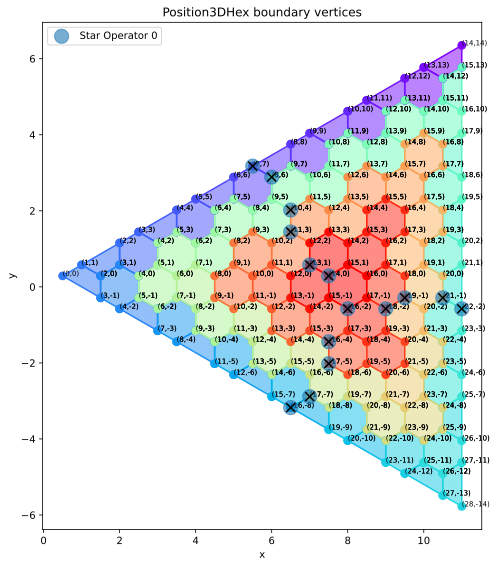

In [9]:
print("X stabilizers + X logical")
temp_utils.plot_position_dict(size = (8,8),stabilizers=stabs_x, star_op=star_ops_x)

Z stabilizers + Z logical


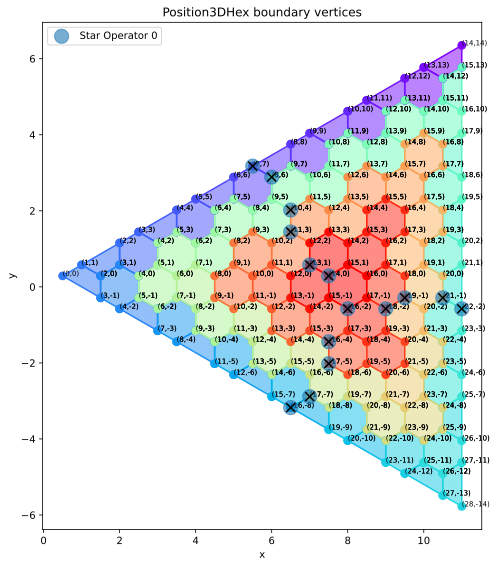

In [10]:
print("Z stabilizers + Z logical")
temp_utils.plot_position_dict(size = (8,8),stabilizers=stabs_z, star_op=star_ops_z)

In [11]:
pos_to_int = temp_utils.build_position_encoding(stabs_x)

trans_z = temp_utils.translate_stabilizers(stabs_z, pos_to_int)
trans_x = temp_utils.translate_stabilizers(stabs_x, pos_to_int)

num_qubits = len(pos_to_int.values())

hz = temp_utils.build_check_matrix(trans_z, num_qubits)
hx = temp_utils.build_check_matrix(trans_x, num_qubits)

#if csscode runs, we actually have a valid code in which all stabilizers commute
csscode = mqt.qecc.codes.css_code.CSSCode(d, hx, hz)
print("CSSCode successfully constructed...")

star_op = [star_ops_x[0]] #change shape to make next function work
star_op = temp_utils.translate_stabilizers(star_op, pos_to_int) #use the stabilizer translation function also for logical ops
star_op = temp_utils.build_check_matrix(star_op, num_qubits)
check = temp_utils.check_logical_operator(star_op, hz)
print("The X logical commutes with all Z stabilizers:", check)

star_op = [star_ops_z[0]] #change shape to make next function work
star_op = temp_utils.translate_stabilizers(star_op, pos_to_int) #use the stabilizer translation function also for logical ops
star_op = temp_utils.build_check_matrix(star_op, num_qubits)
check = temp_utils.check_logical_operator(star_op, hx)
print("The Z logical commutes with all X stabilizers:", check)


CSSCode successfully constructed...
The X logical commutes with all Z stabilizers: True
The Z logical commutes with all X stabilizers: True


## Stabilizers Time Slice 1 (merged object)

In [12]:
z=1
d=15
stabs_x, stabs_z, _, _, _ = g.stabilizers_timeslice(z,d)

In [13]:
star_ops_x, star_ops_z = g.star_operator_timeslice(z, d)
print(len(star_ops_x), len(star_ops_z))

1 0


X stabilizers + X logical


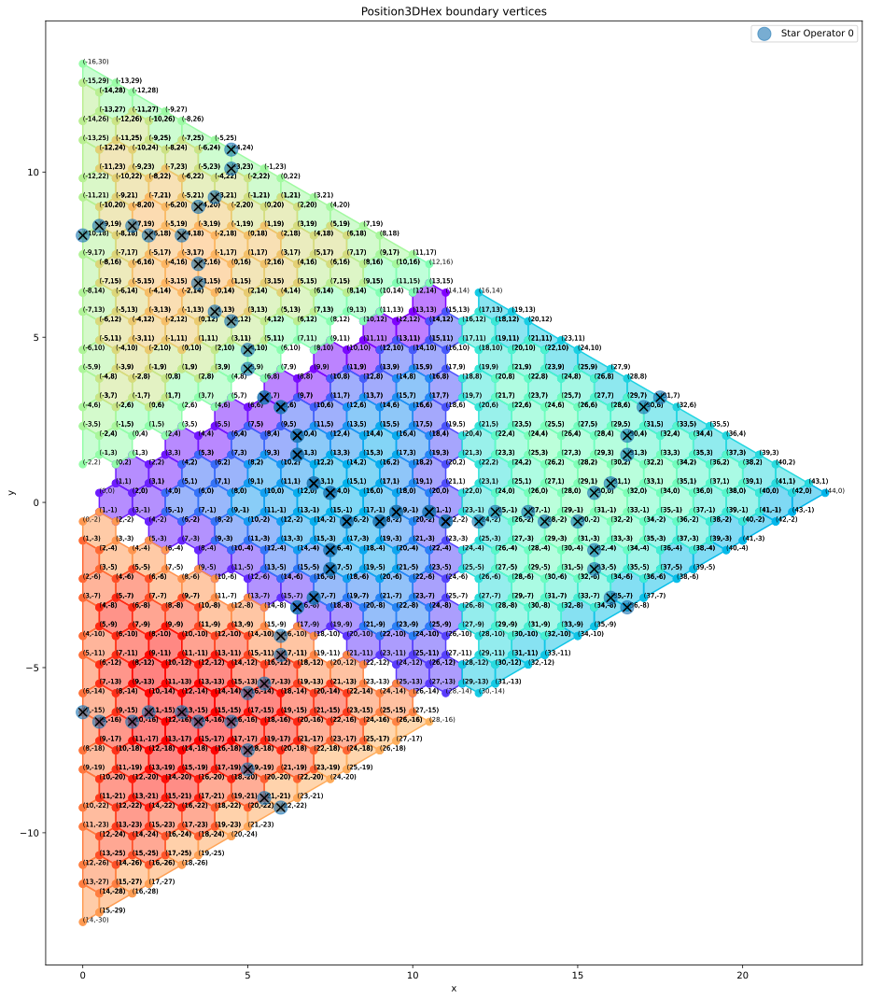

In [14]:
print("X stabilizers + X logical")
temp_utils.plot_position_dict(size = (15,15),stabilizers=stabs_x, star_op=star_ops_x)

Z stabilizers


/mnt/c/Users/Laura/Documents/Codes_and_Repos/tqec_cococo/tqec/temp-laura/temp_utils.py:120: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


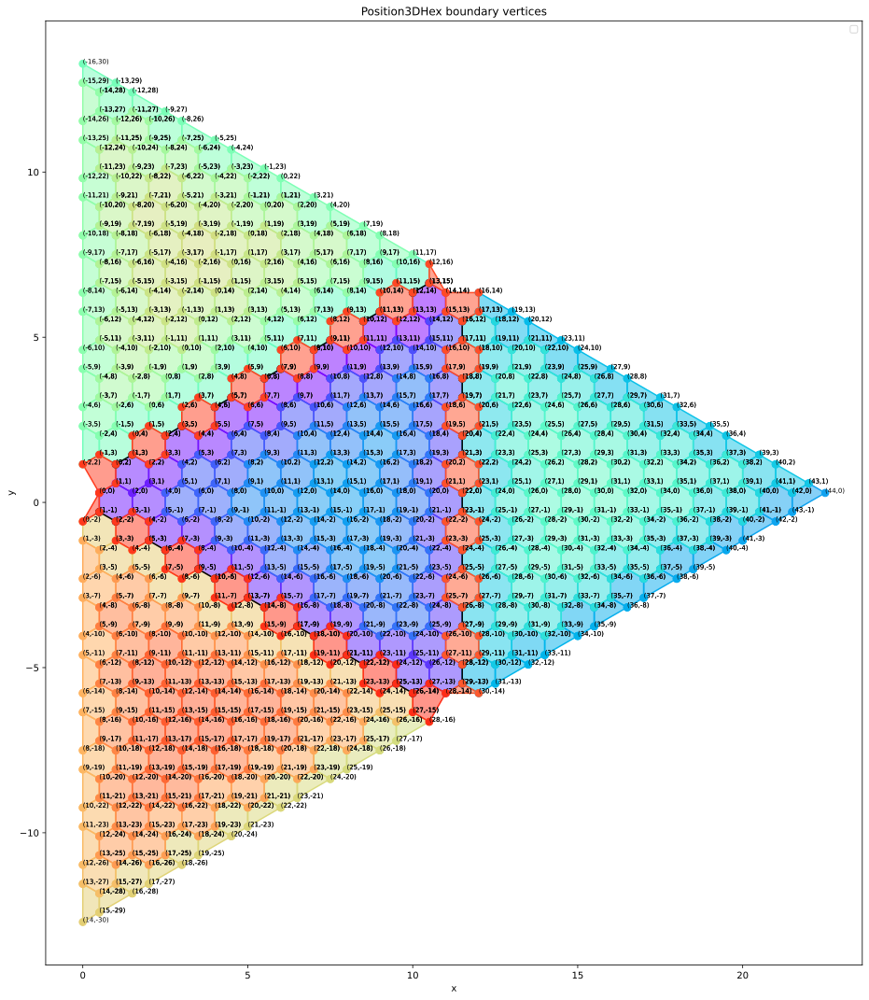

In [15]:
print("Z stabilizers")
temp_utils.plot_position_dict(size = (15,15),stabilizers=stabs_z)

In [16]:
pos_to_int = temp_utils.build_position_encoding(stabs_x)

trans_z = temp_utils.translate_stabilizers(stabs_z, pos_to_int)
trans_x = temp_utils.translate_stabilizers(stabs_x, pos_to_int)

num_qubits = len(pos_to_int.values())

hz = temp_utils.build_check_matrix(trans_z, num_qubits)
hx = temp_utils.build_check_matrix(trans_x, num_qubits)

#if csscode runs, we actually have a valid code in which all stabilizers commute
csscode = mqt.qecc.codes.css_code.CSSCode(d, hx, hz)
print("CSSCode successfully constructed...")

star_op = [star_ops_x[0]] #change shape to make next function work
star_op = temp_utils.translate_stabilizers(star_op, pos_to_int) #use the stabilizer translation function also for logical ops
star_op = temp_utils.build_check_matrix(star_op, num_qubits)
check = temp_utils.check_logical_operator(star_op, hz)
print("The X logical commutes with all Z stabilizers:", check)

#star_op = [star_ops_z[0]] #change shape to make next function work
#star_op = translate_stabilizers(star_op, pos_to_int) #use the stabilizer translation function also for logical ops
#star_op = build_check_matrix(star_op, num_qubits)
#check = check_logical_operator(star_op, hx)
#print("The Z logical commutes with all X stabilizers:", check)


CSSCode successfully constructed...
The X logical commutes with all Z stabilizers: True


# Multiple Rank-5, -3, -2 Junctions

In [17]:
g = PrismGraph("Id-rank3s")

prisms = [
    (Position3DHex(-1, 5, 0), "PORT", "in-5"),
    (Position3DHex(-3, 5, 0), "PORT", "in-4"),
    (Position3DHex(-2, 4, 0), "NN", ""),
    (Position3DHex(-1, 3, 0), "ZZ", ""),
    (Position3DHex(0, 0, 0), "PORT", "in-1"),
    (Position3DHex(1, 1, 0), "ZZ", ""),
    (Position3DHex(0, 2, 0), "ZZ", ""),
    (Position3DHex(2, 0, 0), "ZZ", ""),
    (Position3DHex(3, 1, 0), "ZZ", ""),
    (Position3DHex(4, 0, 0), "NN", ""),
    (Position3DHex(5, 1, 0), "PORT", "in-2"),
    (Position3DHex(5, -1, 0), "PORT", "in-3"),

    #vertical ports
    (Position3DHex(-2, 4, 1), "PORT", "in-6"),
    (Position3DHex(-2, 4, -1), "PORT", "in-7"),

    (Position3DHex(4, 0, 1), "PORT", "in-8"),
    (Position3DHex(4, 0, -1), "PORT", "in-9"),
]

for pos, kind, label in prisms:
    g.add_prism(pos, kind, label)

In [18]:
pipe_kind = PrismPipeKind(hor = BasisPrism.Z, ver = BasisPrism.X)
g.add_pipe(prisms[0][0], prisms[2][0], pipe_kind)

g.add_pipe(prisms[1][0], prisms[2][0], pipe_kind)

g.add_pipe(prisms[3][0], prisms[2][0], pipe_kind)

g.add_pipe(prisms[3][0], prisms[6][0], pipe_kind)

g.add_pipe(prisms[5][0], prisms[6][0], pipe_kind)

g.add_pipe(prisms[5][0], prisms[4][0], pipe_kind)

g.add_pipe(prisms[5][0], prisms[7][0], pipe_kind)

g.add_pipe(prisms[7][0], prisms[8][0], pipe_kind)

g.add_pipe(prisms[5][0], prisms[6][0], pipe_kind)

g.add_pipe(prisms[9][0], prisms[8][0], pipe_kind)

g.add_pipe(prisms[9][0], prisms[10][0], pipe_kind)

g.add_pipe(prisms[9][0], prisms[11][0], pipe_kind)

#vertical pipes
pipe_kind = PrismPipeKind(hor = BasisPrism.N, ver = BasisPrism.N)
g.add_pipe(prisms[2][0], prisms[12][0], pipe_kind)
g.add_pipe(prisms[2][0], prisms[13][0], pipe_kind)

g.add_pipe(prisms[9][0], prisms[14][0], pipe_kind)
g.add_pipe(prisms[9][0], prisms[15][0], pipe_kind)

In [19]:
g.view_as_html()

add screenshot as browser version of github does not display this properly

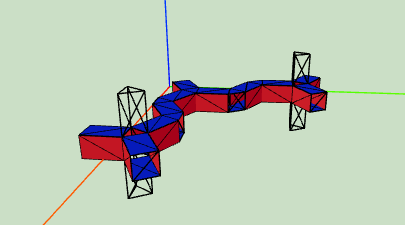

(<Figure size 500x600 with 1 Axes>, <Axes3D: >)

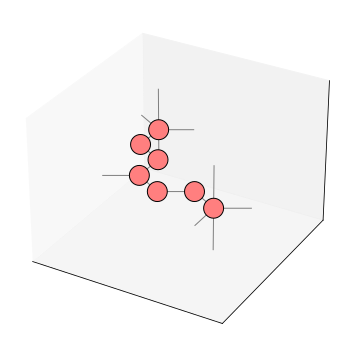

In [20]:
zx = g.to_zx_graph()
zx.draw()

## Stabilizers in timeslice 0 (merged object)

In [21]:
z=0
d=11
stabs_x, stabs_z, _, _, _ = g.stabilizers_timeslice(z,d)

In [22]:
star_ops_x, star_ops_z = g.star_operator_timeslice(z, d)
print(len(star_ops_x), len(star_ops_z))

0 1


In [23]:
print("X stabilizers")
temp_utils.plot_position_dict(size = (20,20),stabilizers=stabs_x)

X stabilizers


In [24]:
print("Z stabilizers + Z logical")
temp_utils.plot_position_dict(size = (20,20),stabilizers=stabs_z, star_op=star_ops_z)

Z stabilizers + Z logical


In [25]:
pos_to_int = temp_utils.build_position_encoding(stabs_x)

trans_z = temp_utils.translate_stabilizers(stabs_z, pos_to_int)
trans_x = temp_utils.translate_stabilizers(stabs_x, pos_to_int)

num_qubits = len(pos_to_int.values())

hz = temp_utils.build_check_matrix(trans_z, num_qubits)
hx = temp_utils.build_check_matrix(trans_x, num_qubits)

#if csscode runs, we actually have a valid code in which all stabilizers commute
csscode = mqt.qecc.codes.css_code.CSSCode(d, hx, hz)
print("CSSCode successfully constructed...")

#star_op = [star_ops_x[0]] #change shape to make next function work
#star_op = translate_stabilizers(star_op, pos_to_int) #use the stabilizer translation function also for logical ops
#star_op = build_check_matrix(star_op, num_qubits)
#check = check_logical_operator(star_op, hz)
#print("The X logical commutes with all Z stabilizers:", check)

star_op = [star_ops_z[0]] #change shape to make next function work
star_op = temp_utils.translate_stabilizers(star_op, pos_to_int) #use the stabilizer translation function also for logical ops
star_op = temp_utils.build_check_matrix(star_op, num_qubits)
check = temp_utils.check_logical_operator(star_op, hx)
print("The Z logical commutes with all X stabilizers:", check)


CSSCode successfully constructed...
The Z logical commutes with all X stabilizers: True


## Stabilizers in timeslice 1 (single patches)

In [27]:
z=1
d=11
stabs_x, stabs_z, _, _, _ = g.stabilizers_timeslice(z,d)

In [ ]:
star_ops_x, star_ops_z = g.star_operator_timeslice(z, d)
print(len(star_ops_x), len(star_ops_z))

2 2


X stabilizers + X logicals


/mnt/c/Users/Laura/Documents/Codes_and_Repos/tqec_cococo/tqec/temp-laura/temp_utils.py:120: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


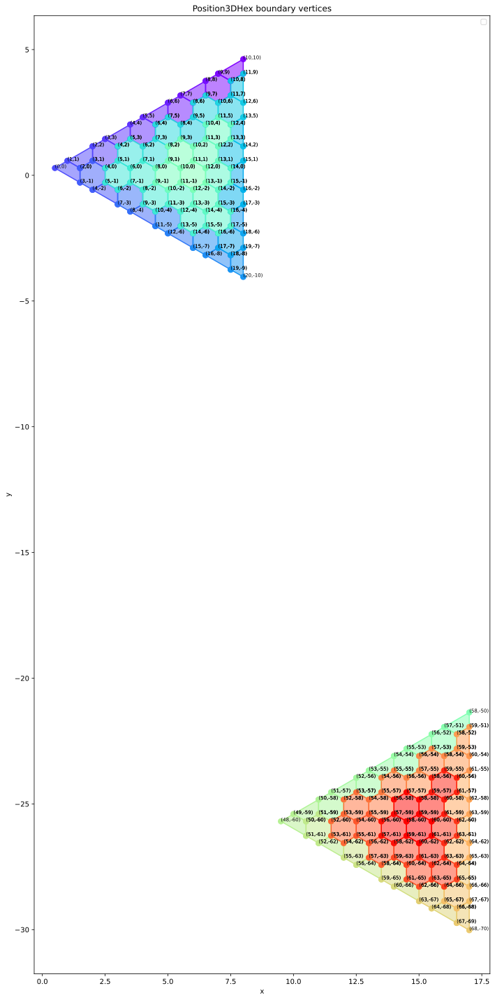

In [28]:
print("X stabilizers + X logicals")
temp_utils.plot_position_dict(size = (20,20),stabilizers=stabs_x, star_op=star_ops_x)

Z stabilizers + Z logicals


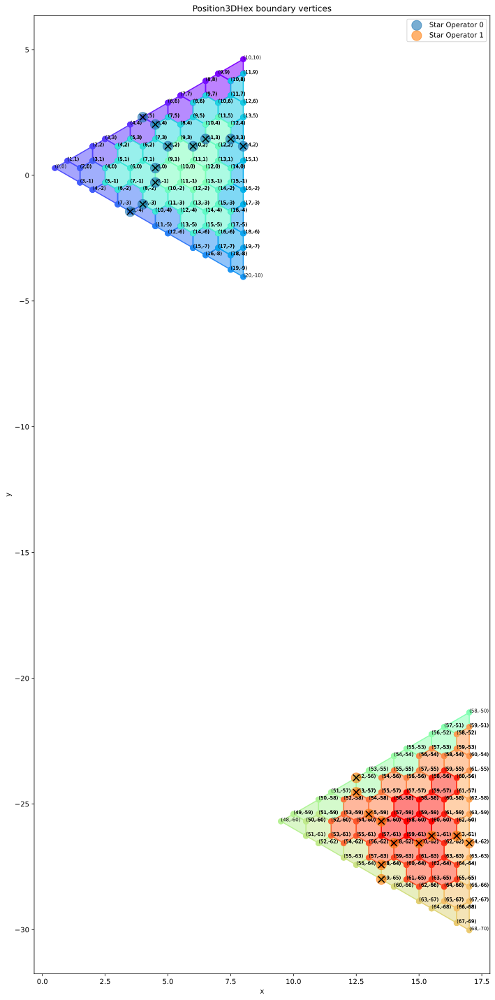

In [ ]:
print("Z stabilizers + Z logicals")
temp_utils.plot_position_dict(size = (20,20),stabilizers=stabs_z, star_op=star_ops_z)

In [ ]:
pos_to_int = temp_utils.build_position_encoding(stabs_x)

trans_z = temp_utils.translate_stabilizers(stabs_z, pos_to_int)
trans_x = temp_utils.translate_stabilizers(stabs_x, pos_to_int)

num_qubits = len(pos_to_int.values())

hz = temp_utils.build_check_matrix(trans_z, num_qubits)
hx = temp_utils.build_check_matrix(trans_x, num_qubits)

#if csscode runs, we actually have a valid code in which all stabilizers commute
csscode = mqt.qecc.codes.css_code.CSSCode(d, hx, hz)
print("CSSCode successfully constructed...")

for starop in star_ops_x:
    star_op = [starop] #change shape to make next function work
    star_op = temp_utils.translate_stabilizers(star_op, pos_to_int) #use the stabilizer translation function also for logical ops
    star_op = temp_utils.build_check_matrix(star_op, num_qubits)
    check = temp_utils.check_logical_operator(star_op, hz)
    print("The X logical commutes with all Z stabilizers:", check)

for starop in star_ops_z:
    star_op = [starop] #change shape to make next function work
    star_op = temp_utils.translate_stabilizers(star_op, pos_to_int) #use the stabilizer translation function also for logical ops
    star_op = temp_utils.build_check_matrix(star_op, num_qubits)
    check = temp_utils.check_logical_operator(star_op, hx)
    print("The Z logical commutes with all X stabilizers:", check)


CSSCode successfully constructed...
The X logical commutes with all Z stabilizers: True
The X logical commutes with all Z stabilizers: True
The Z logical commutes with all X stabilizers: True
The Z logical commutes with all X stabilizers: True


In [ ]:
#todo sanity check the correlation surface
corr_surf = find_correlation_surfaces(zx._g)

#for el in corr_surf:
#    print(el)